In [83]:
library(plotly)
library(ggplot2)
library(dplyr)
install.packages("lmtest")
library(lmtest)
install.packages("coefplot")
library(coefplot)
install.packages("nloptr")
install.packages("pbkrtest")
install.packages("lme4")
install.packages("car")
library(car)
install.packages("ridge")


Installing package into ‘/home/shreyas/R/x86_64-pc-linux-gnu-library/4.3’
(as ‘lib’ is unspecified)



Installing package into ‘/home/shreyas/R/x86_64-pc-linux-gnu-library/4.3’
(as ‘lib’ is unspecified)

Installing package into ‘/home/shreyas/R/x86_64-pc-linux-gnu-library/4.3’
(as ‘lib’ is unspecified)

Installing package into ‘/home/shreyas/R/x86_64-pc-linux-gnu-library/4.3’
(as ‘lib’ is unspecified)

also installing the dependency ‘lme4’


Installing package into ‘/home/shreyas/R/x86_64-pc-linux-gnu-library/4.3’
(as ‘lib’ is unspecified)

Installing package into ‘/home/shreyas/R/x86_64-pc-linux-gnu-library/4.3’
(as ‘lib’ is unspecified)

Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


Installing package into ‘/home/shreyas/R/x86_64-pc-linux-gnu-library/4.3’
(as ‘lib’ is unspecified)

Warning message in install.packages("ridge"):
“installation of package ‘ridge’ had non-zero exit status”


In [82]:
update.packages(ask = FALSE)



Warning message in install.packages(update[instlib == l, "Package"], l, contriburl = contriburl, :
“'lib = "/usr/lib/R/library"' is not writable”


ERROR: Error in install.packages(update[instlib == l, "Package"], l, contriburl = contriburl, : unable to install packages


In [41]:
WeatherData <- read.csv("shuffle_file.csv")

In [42]:
numeric_data <- WeatherData[, sapply(WeatherData, is.numeric)]
numeric_data <- numeric_data[, sapply(numeric_data, function(x) sd(x, na.rm = TRUE) != 0)]


# Compute the correlation matrix, using complete observations to handle missing values
correlation_matrix <- cor(numeric_data, use = "complete.obs")

# Print the correlation matrix
print(correlation_matrix)


                       Temperature Apparent_Temperature     Humidity
Temperature           1.0000000000          0.992519390 -0.625334581
Apparent_Temperature  0.9925193899          1.000000000 -0.594075321
Humidity             -0.6253345814         -0.594075321  1.000000000
Wind_Speed           -0.0009092771         -0.067612667 -0.227306816
Wind_Bearing          0.0434236301          0.041391143  0.003178171
Visibility            0.3874160312          0.376087537 -0.353178865
Pressure             -0.0004293969          0.005297679  0.013583844
                        Wind_Speed Wind_Bearing  Visibility      Pressure
Temperature          -0.0009092771  0.043423630  0.38741603 -0.0004293969
Apparent_Temperature -0.0676126665  0.041391143  0.37608754  0.0052976791
Humidity             -0.2273068157  0.003178171 -0.35317887  0.0135838438
Wind_Speed            1.0000000000  0.096482680  0.09445563 -0.0591735987
Wind_Bearing          0.0964826803  1.000000000  0.06199878 -0.0154464862
Visi

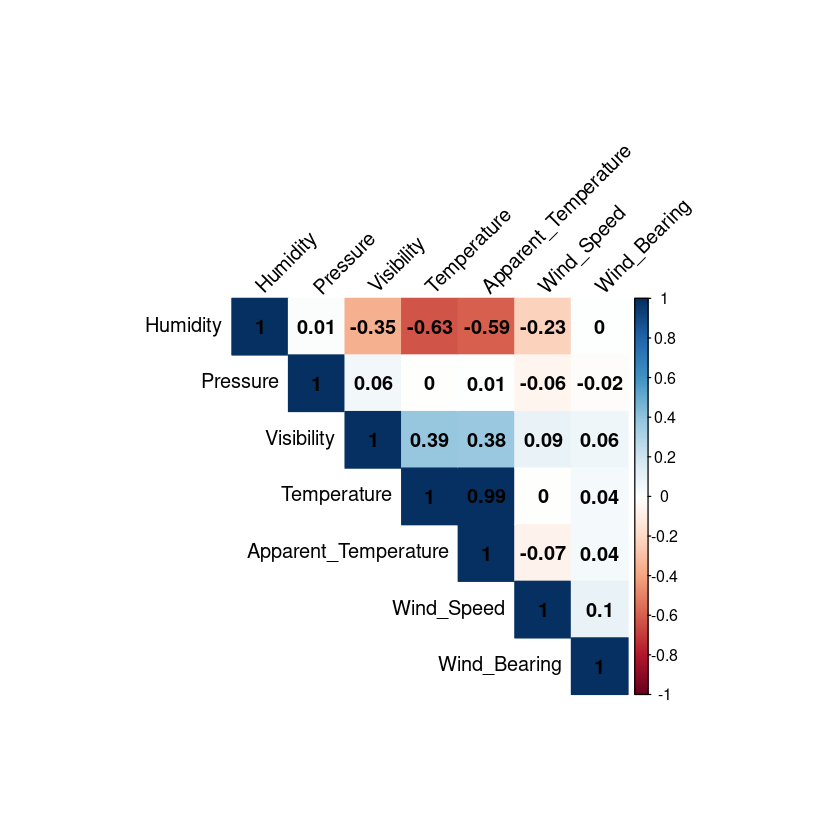

In [43]:


# Optionally, use corrplot to visualize the correlation matrix
if (!require("corrplot")) install.packages("corrplot")
library(corrplot)

# Visualize the correlation matrix
corrplot(correlation_matrix, method = "color", type = "upper", order = "hclust",
         tl.col = "black", tl.srt = 45, addCoef.col = "black")


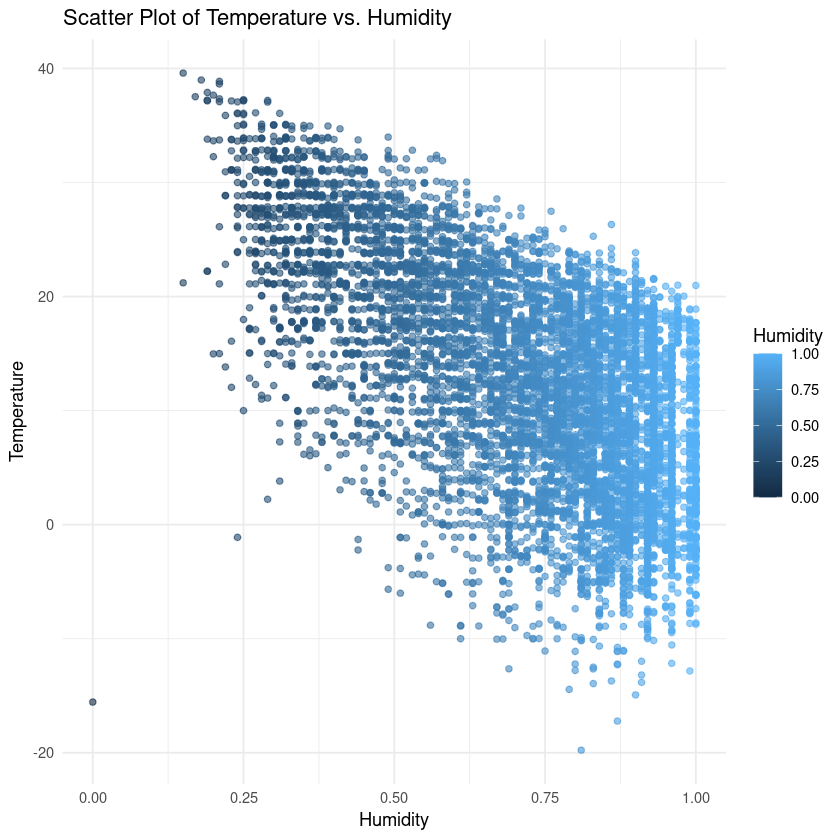

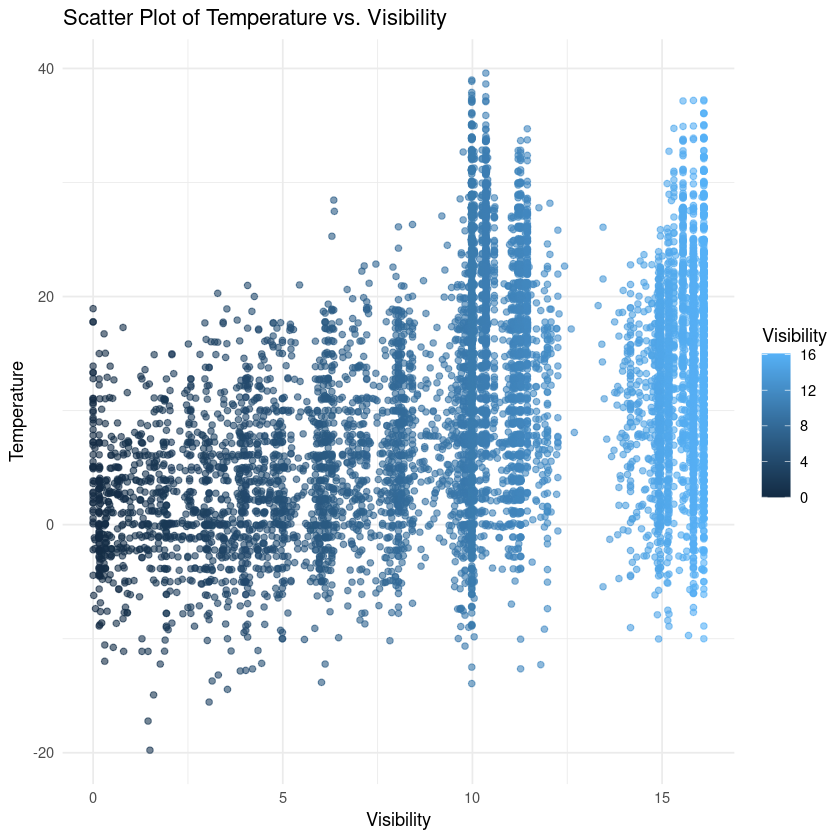

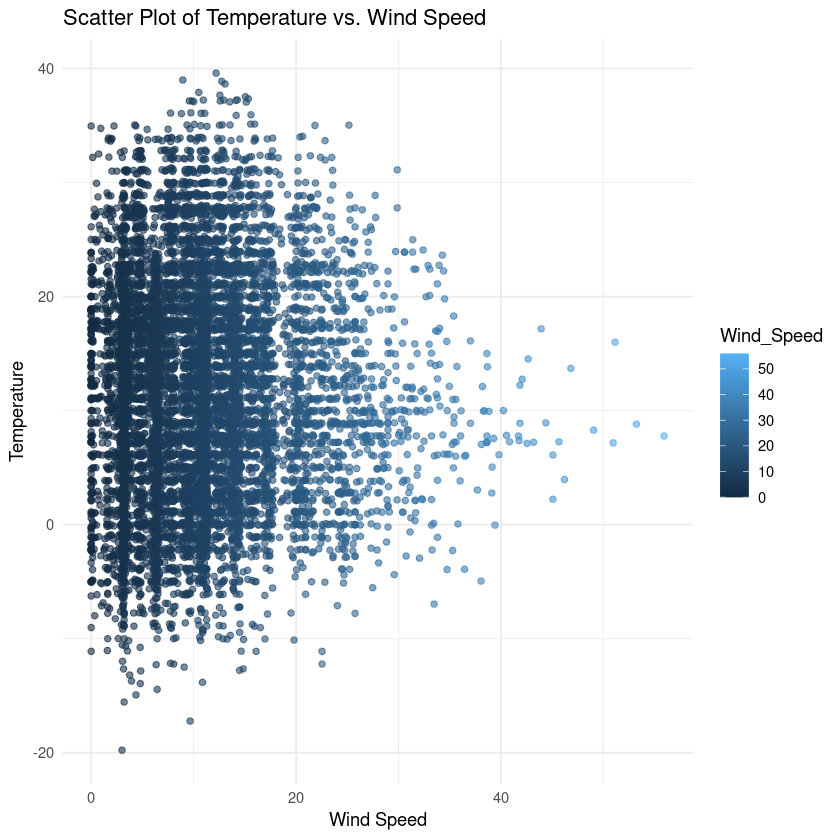

In [44]:


# Scatter plot of Temperature vs. Humidity
p1 <- ggplot(WeatherData, aes(x = Humidity, y = Temperature)) +
  geom_point(aes(color = Humidity), alpha = 0.6) +  # Points with color gradient based on Humidity
  labs(title = "Scatter Plot of Temperature vs. Humidity",
       x = "Humidity", y = "Temperature") +
  theme_minimal()

# Scatter plot of Temperature vs. Visibility
p2 <- ggplot(WeatherData, aes(x = Visibility, y = Temperature)) +
  geom_point(aes(color = Visibility), alpha = 0.6) +
  labs(title = "Scatter Plot of Temperature vs. Visibility",
       x = "Visibility", y = "Temperature") +
  theme_minimal()

# Scatter plot of Visibility vs. Wind Speed
p3 <- ggplot(WeatherData, aes(x = Wind_Speed, y = Temperature)) +
  geom_point(aes(color = Wind_Speed), alpha = 0.6) +
  labs(title = "Scatter Plot of Temperature vs. Wind Speed",
       x = "Wind Speed", y = "Temperature") +
  theme_minimal()

# Print the plots
print(p1)
print(p2)
print(p3)



In [45]:
plot_ly(WeatherData, x = ~Humidity, y = ~Visibility, z = ~Wind_Speed, color = temp_model_residuals, type = "scatter3d", mode = "markers") %>%
  layout(title = "3D Scatter Plot of Residuals from Temperature Model",
         scene = list(xaxis = list(title = "Humidity"),
                      yaxis = list(title = "Visibility"),
                      zaxis = list(title = "Wind Speed")))


HTML widgets cannot be represented in plain text (need html)

In [46]:
temp_model <- lm(Temperature ~ Humidity + Visibility + Wind_Speed + Pressure + Wind_Bearing , data = WeatherData)

temp_model_summary <- summary(temp_model)

temp_model_summary

temp_model_residuals <- temp_model$residuals

fitted_values_temp_model <- fitted(temp_model)

AIC(temp_model)


Call:
lm(formula = Temperature ~ Humidity + Visibility + Wind_Speed + 
    Pressure + Wind_Bearing, data = WeatherData)

Residuals:
    Min      1Q  Median      3Q     Max 
-47.376  -4.496   0.385   5.311  19.198 

Coefficients:
               Estimate Std. Error t value Pr(>|t|)    
(Intercept)   3.127e+01  7.277e-01  42.972  < 2e-16 ***
Humidity     -2.894e+01  3.962e-01 -73.053  < 2e-16 ***
Visibility    4.318e-01  1.812e-02  23.831  < 2e-16 ***
Wind_Speed   -2.179e-01  1.050e-02 -20.743  < 2e-16 ***
Pressure     -9.807e-04  5.894e-04  -1.664   0.0961 .  
Wind_Bearing  4.280e-03  6.581e-04   6.504 8.22e-11 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 7.051 on 9994 degrees of freedom
Multiple R-squared:  0.4477,	Adjusted R-squared:  0.4474 
F-statistic:  1620 on 5 and 9994 DF,  p-value: < 2.2e-16


[1] 67449.61

`geom_smooth()` using formula = 'y ~ x'


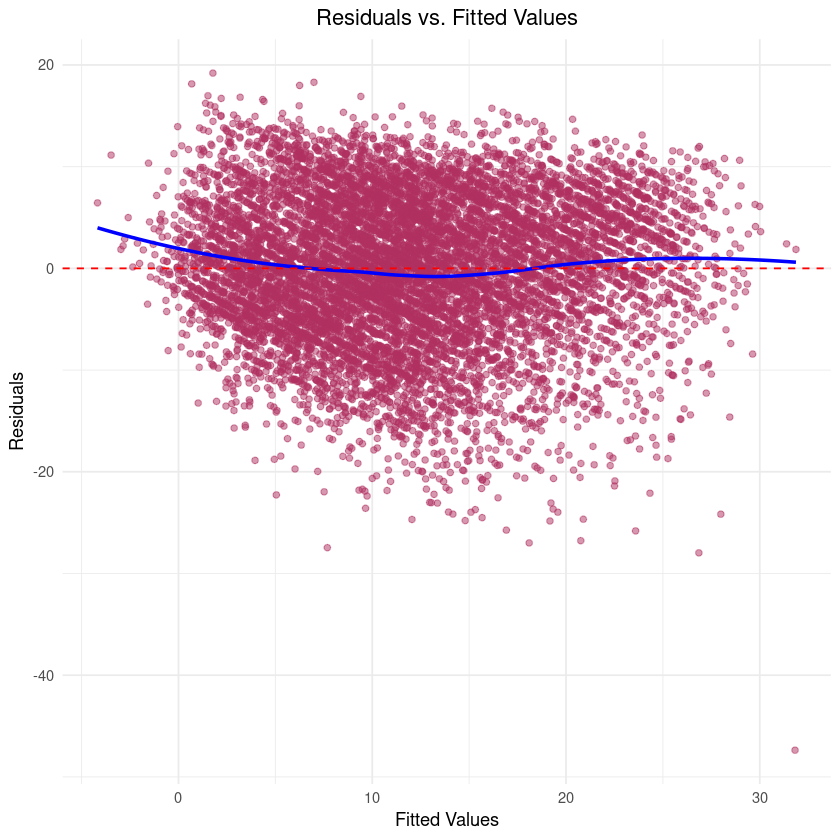

In [47]:

ggplot(data = NULL, aes(x = fitted_values_temp_model, y = temp_model_residuals)) +
  geom_point(alpha = 0.5, color = "maroon") +  # Add points with some transparency
  geom_smooth(method = "loess", se = FALSE, color = "blue") +  # Add a LOESS smoother without confidence interval
  geom_hline(yintercept = 0, linetype = "dashed", color = "red") +# Add a horizontal line at zero
  labs(title = "Residuals vs. Fitted Values",
       x = "Fitted Values",
       y = "Residuals") +
  theme_minimal() +  # Use a minimal theme
  theme(plot.title = element_text(hjust = 0.5))  #



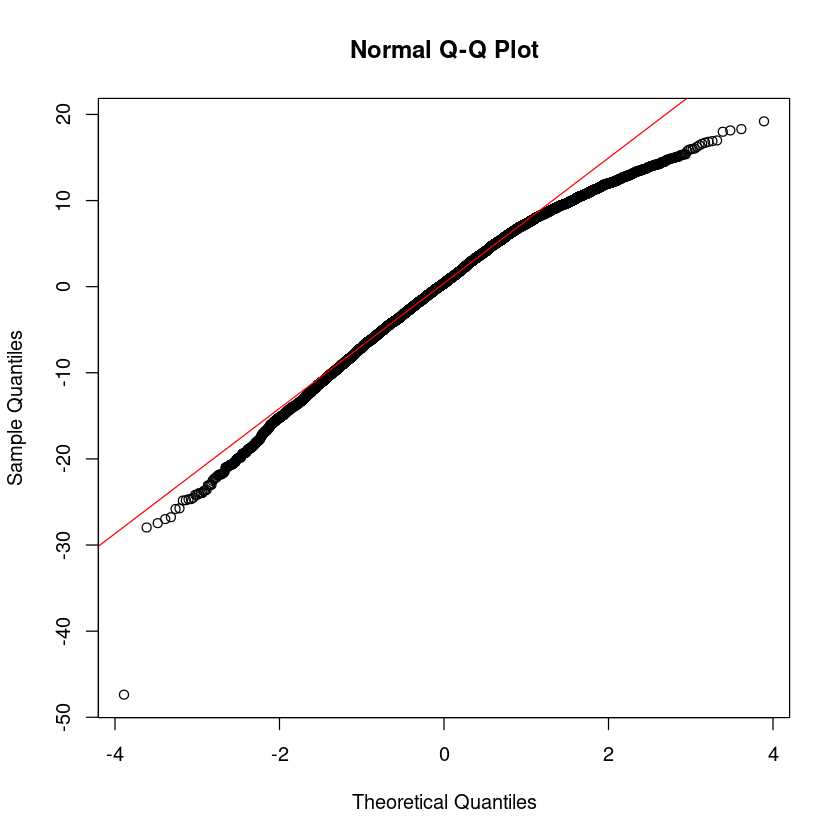

In [48]:
# QQ plot of residuals
qqnorm(temp_model_residuals)
qqline(temp_model_residuals, col = "red") 

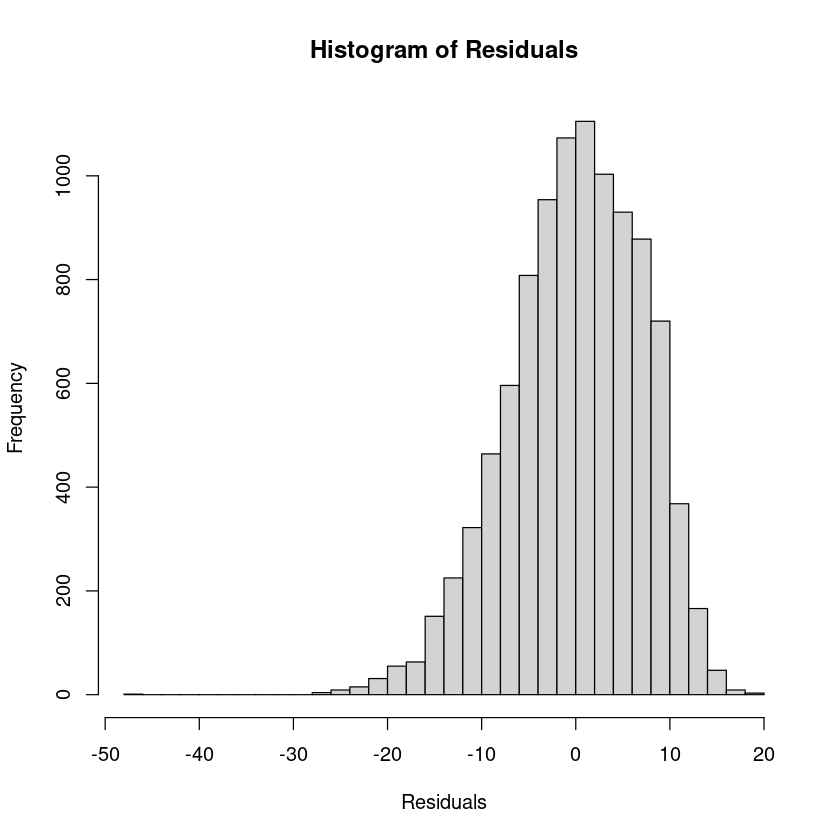

In [49]:
# Histogram of residuals
hist(temp_model_residuals, breaks = 30 ,main = "Histogram of Residuals", xlab = "Residuals")


We Can see from the P - Values that humidity, Visibility , Wind Speed and Wind Bearing are significant variables in prediction of temperature 

In [50]:
temp_model_2 <- lm(Temperature ~ Humidity + Visibility + Wind_Speed  + Wind_Bearing , data = WeatherData)

temp_model_summary_2 <- summary(temp_model_2)

temp_model_summary_2

temp_model_residuals_2 <- temp_model_2$residuals

fitted_values_temp_model_2 <- fitted(temp_model_2)


AIC(temp_model_2)


Call:
lm(formula = Temperature ~ Humidity + Visibility + Wind_Speed + 
    Wind_Bearing, data = WeatherData)

Residuals:
    Min      1Q  Median      3Q     Max 
-47.424  -4.500   0.391   5.307  19.186 

Coefficients:
               Estimate Std. Error t value Pr(>|t|)    
(Intercept)   3.031e+01  4.414e-01  68.668   <2e-16 ***
Humidity     -2.896e+01  3.961e-01 -73.110   <2e-16 ***
Visibility    4.297e-01  1.808e-02  23.770   <2e-16 ***
Wind_Speed   -2.169e-01  1.049e-02 -20.680   <2e-16 ***
Wind_Bearing  4.296e-03  6.581e-04   6.528    7e-11 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 7.051 on 9995 degrees of freedom
Multiple R-squared:  0.4475,	Adjusted R-squared:  0.4473 
F-statistic:  2024 on 4 and 9995 DF,  p-value: < 2.2e-16


[1] 67450.38

`geom_smooth()` using formula = 'y ~ x'


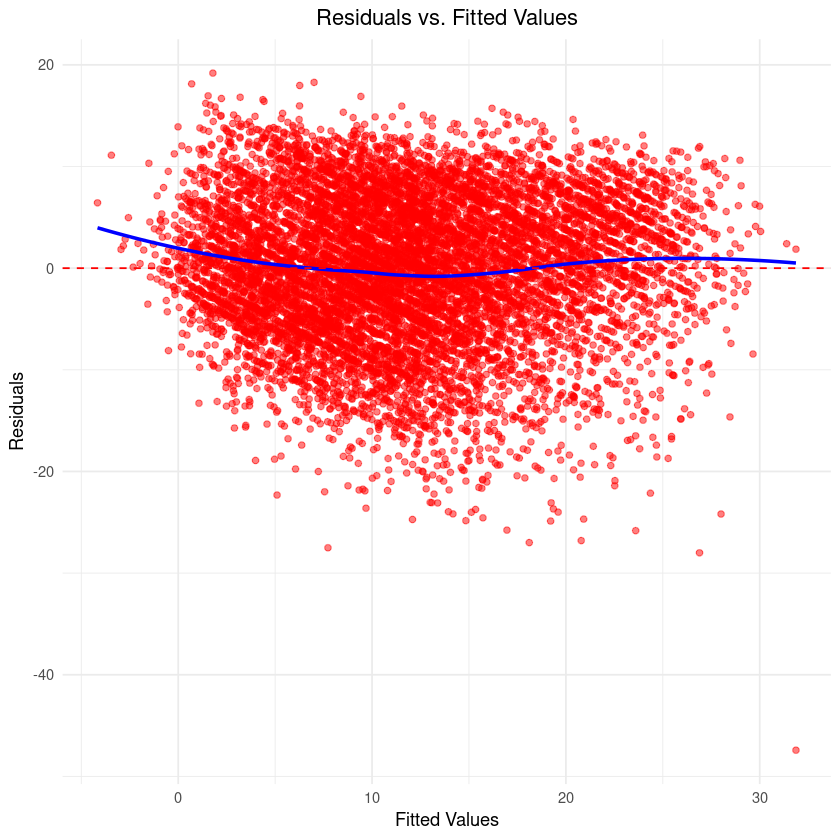

In [51]:
ggplot(data = NULL, aes(x = fitted_values_temp_model_2, y = temp_model_residuals_2)) +
  geom_point(alpha = 0.5, color = "red") +  # Add points with some transparency
  geom_smooth(method = "loess", se = FALSE, color = "blue") +  # Add a LOESS smoother without confidence interval
  geom_hline(yintercept = 0, linetype = "dashed", color = "red") +# Add a horizontal line at zero
  labs(title = "Residuals vs. Fitted Values",
       x = "Fitted Values",
       y = "Residuals") +
  theme_minimal() +  # Use a minimal theme
  theme(plot.title = element_text(hjust = 0.5))  #


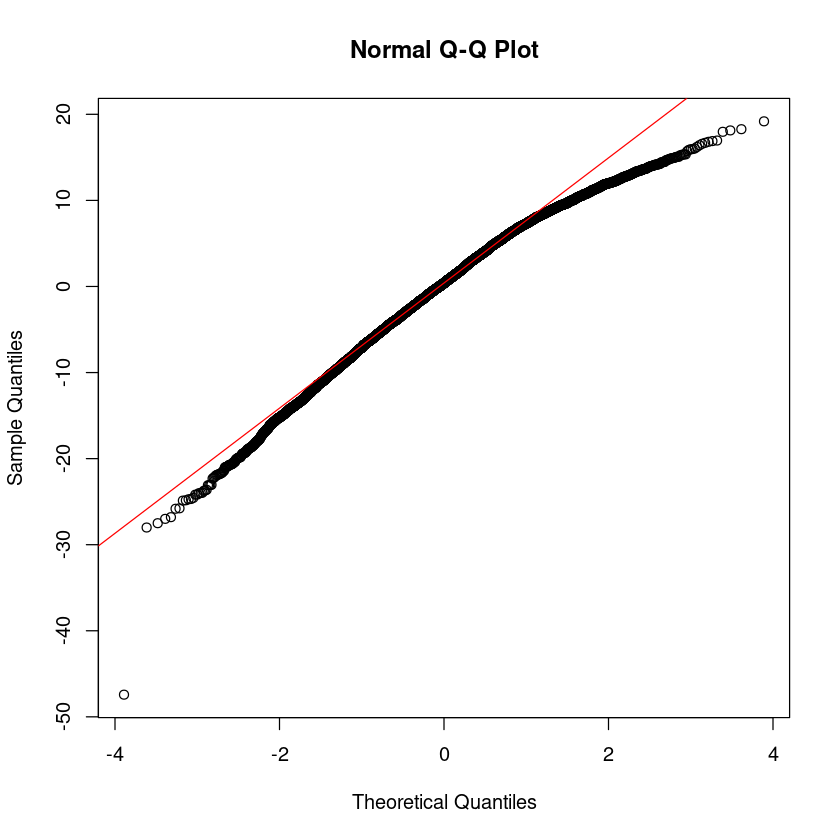

In [52]:
qqnorm(temp_model_residuals_2)
qqline(temp_model_residuals_2, col = "red") 

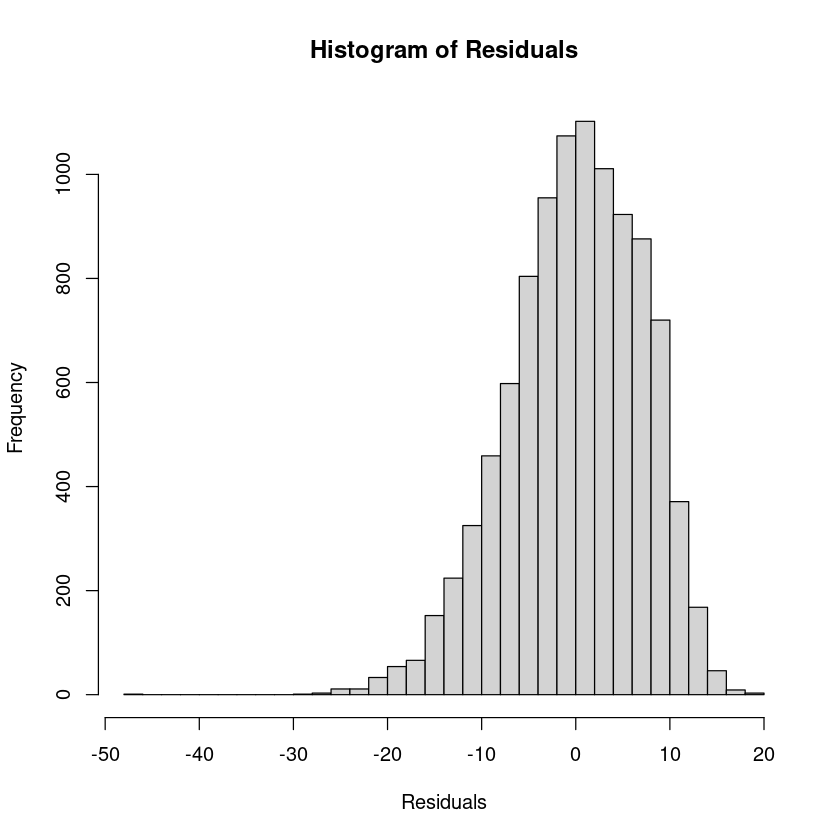

In [53]:
hist(temp_model_residuals_2, breaks = 30 ,main = "Histogram of Residuals", xlab = "Residuals")


In [54]:
temp_model_3 <- lm(Temperature ~ poly(Humidity , 5) + poly(Visibility , 5) + poly(Wind_Speed , 5)  + poly(Wind_Bearing , 5) , data = WeatherData)

temp_model_summary_3 <- summary(temp_model_3)

temp_model_summary_3

temp_model_residuals_3 <- temp_model_3$residuals

fitted_values_temp_model_3 <- fitted(temp_model_3)

AIC(temp_model_3)



Call:
lm(formula = Temperature ~ poly(Humidity, 5) + poly(Visibility, 
    5) + poly(Wind_Speed, 5) + poly(Wind_Bearing, 5), data = WeatherData)

Residuals:
     Min       1Q   Median       3Q      Max 
-28.8266  -4.3586   0.4646   5.0258  21.2088 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)              11.94114    0.06756 176.757  < 2e-16 ***
poly(Humidity, 5)1     -459.76669    8.49644 -54.113  < 2e-16 ***
poly(Humidity, 5)2      170.03706    7.68074  22.138  < 2e-16 ***
poly(Humidity, 5)3      102.53343    7.08702  14.468  < 2e-16 ***
poly(Humidity, 5)4       -0.47784    6.89305  -0.069  0.94473    
poly(Humidity, 5)5       18.16938    6.82090   2.664  0.00774 ** 
poly(Visibility, 5)1    297.05477    8.42670  35.252  < 2e-16 ***
poly(Visibility, 5)2   -131.43770    7.49042 -17.547  < 2e-16 ***
poly(Visibility, 5)3    -76.21177    7.02494 -10.849  < 2e-16 ***
poly(Visibility, 5)4     18.92084    6.93119   2.730  0.00635 ** 
poly(Visi

[1] 66609.38

It can be infered that only 1st three and 5th terms of humidity are significant for temperature prediction. 

SImilarly , all 5 terms of visibility are significant for temperature prediction.

similarly only 1st two terms of wind speed are significant for temperature prediction.

similarly only 1st and 5th term of wind bearing is significant for temperature prediction.

In [55]:
temp_model_4 <- lm(Temperature ~ poly(Humidity, 5)[, c(1, 2, 3, 5)] + poly(Visibility , 5) + poly(Wind_Speed, 2) + poly(Wind_Bearing, 5)[, c(1,5)], data = WeatherData)

temp_model_summary_4 <- summary(temp_model_4)

temp_model_summary_4

temp_model_residuals_4 <- temp_model_4$residuals

fitted_values_temp_model_4 <- fitted(temp_model_4)

AIC(temp_model_4)



Call:
lm(formula = Temperature ~ poly(Humidity, 5)[, c(1, 2, 3, 5)] + 
    poly(Visibility, 5) + poly(Wind_Speed, 2) + poly(Wind_Bearing, 
    5)[, c(1, 5)], data = WeatherData)

Residuals:
     Min       1Q   Median       3Q      Max 
-28.9302  -4.3538   0.4868   5.0324  21.2688 

Coefficients:
                                      Estimate Std. Error t value Pr(>|t|)    
(Intercept)                           11.94114    0.06757 176.713  < 2e-16 ***
poly(Humidity, 5)[, c(1, 2, 3, 5)]1 -460.65598    8.48072 -54.318  < 2e-16 ***
poly(Humidity, 5)[, c(1, 2, 3, 5)]2  169.25420    7.66203  22.090  < 2e-16 ***
poly(Humidity, 5)[, c(1, 2, 3, 5)]3  102.77729    7.07155  14.534  < 2e-16 ***
poly(Humidity, 5)[, c(1, 2, 3, 5)]5   18.43171    6.82007   2.703  0.00689 ** 
poly(Visibility, 5)1                 296.73534    8.36568  35.471  < 2e-16 ***
poly(Visibility, 5)2                -131.56013    7.41871 -17.734  < 2e-16 ***
poly(Visibility, 5)3                 -74.96851    6.99609 -10.716  < 2

[1] 66607.45

`geom_smooth()` using formula = 'y ~ x'


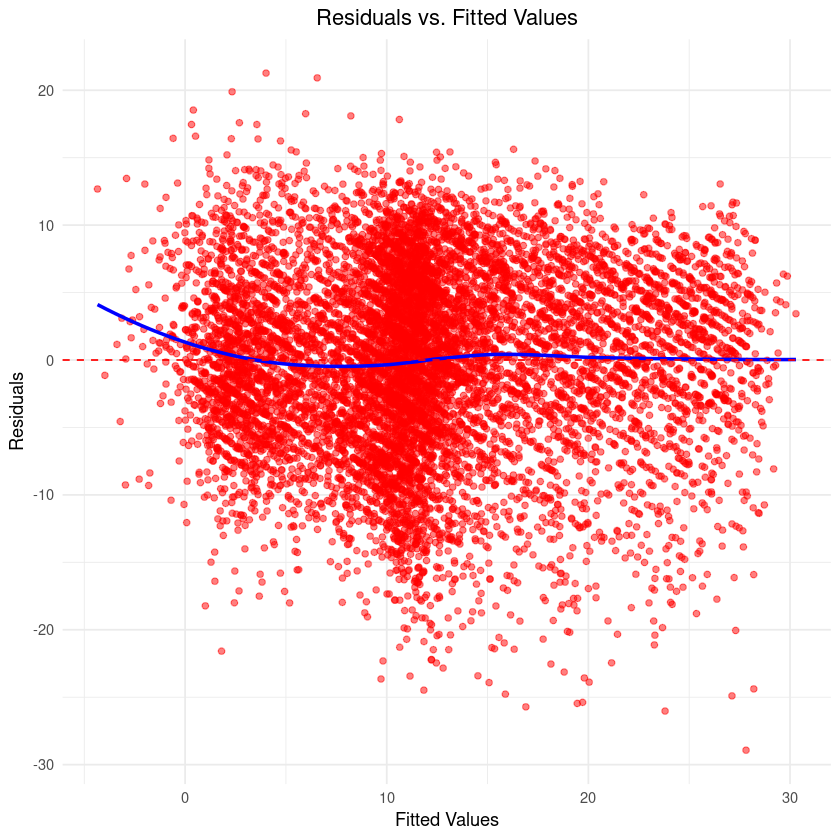

In [56]:
ggplot(data = NULL, aes(x = fitted_values_temp_model_4, y = temp_model_residuals_4)) +
  geom_point(alpha = 0.5, color = "red") +  # Add points with some transparency
  geom_smooth(method = "loess", se = FALSE, color = "blue") +  # Add a LOESS smoother without confidence interval
  geom_hline(yintercept = 0, linetype = "dashed", color = "red") +# Add a horizontal line at zero
  labs(title = "Residuals vs. Fitted Values",
       x = "Fitted Values",
       y = "Residuals") +
  theme_minimal() +  # Use a minimal theme
  theme(plot.title = element_text(hjust = 0.5))  #

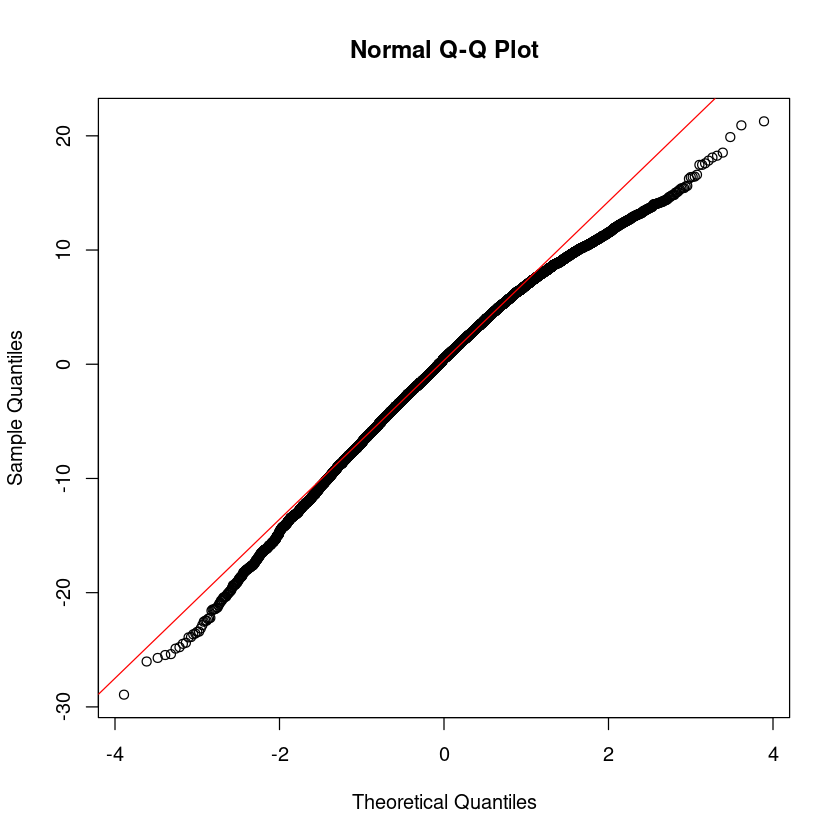

In [57]:
qqnorm(temp_model_residuals_4)
qqline(temp_model_residuals_4, col = "red") 

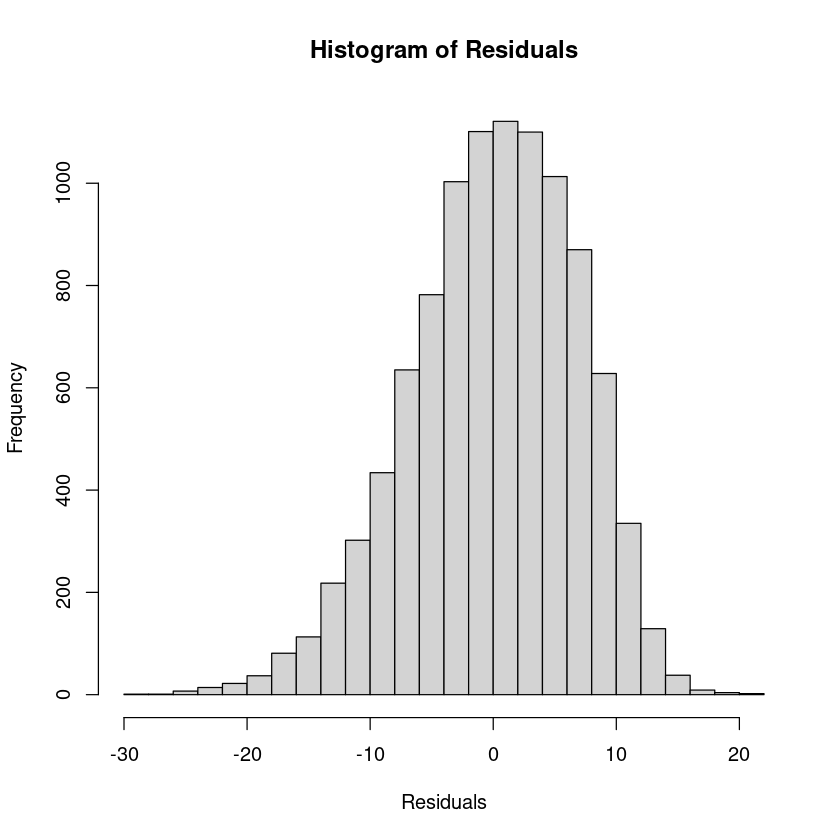

In [58]:
hist(temp_model_residuals_4, breaks = 30 ,main = "Histogram of Residuals", xlab = "Residuals")


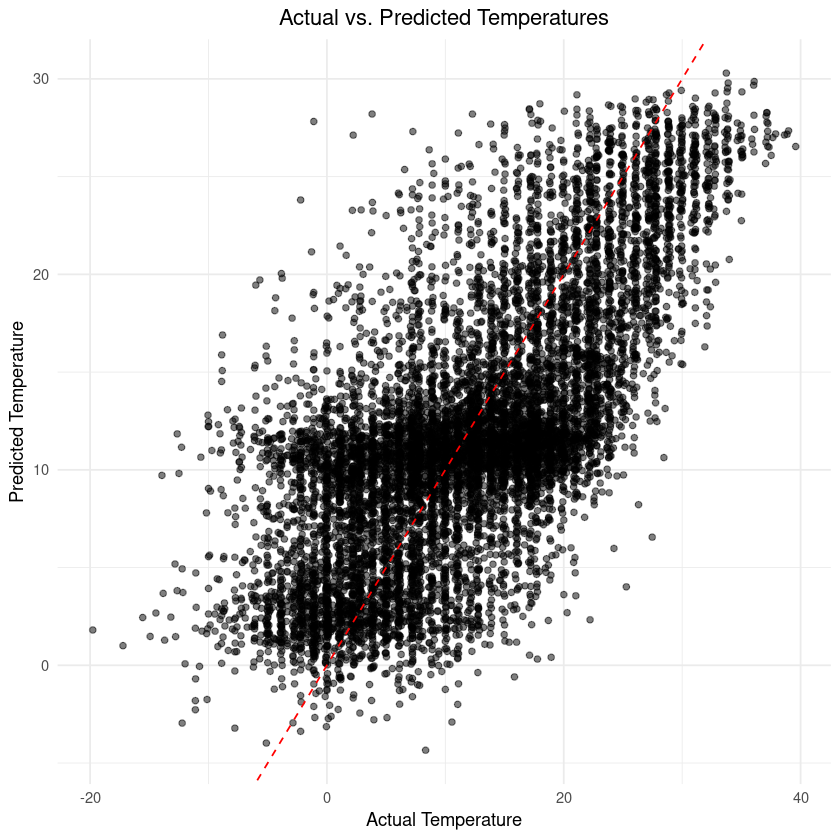

In [59]:
WeatherData$predicted_temperature <- predict(temp_model_4, newdata = WeatherData)
plot_data <- data.frame(Actual = WeatherData$Temperature, Predicted = WeatherData$predicted_temperature)

ggplot(plot_data, aes(x = Actual, y = Predicted)) +
  geom_point(alpha = 0.5) +  # add points with some transparency
  geom_abline(color = "red", linetype = "dashed") +  # adds a reference line where predicted = actual
  labs(title = "Actual vs. Predicted Temperatures",
       x = "Actual Temperature",
       y = "Predicted Temperature") +
  theme_minimal() +  # use a minimalistic theme
  theme(plot.title = element_text(hjust = 0.5))  

In [60]:
length(temp_model_residuals_4)
sampled_residuals <- sample(temp_model_residuals_4, 5000)

shapiro_test <- shapiro.test(sampled_residuals)

print(shapiro_test)


[1] 10000


	Shapiro-Wilk normality test

data:  sampled_residuals
W = 0.98979, p-value < 2.2e-16



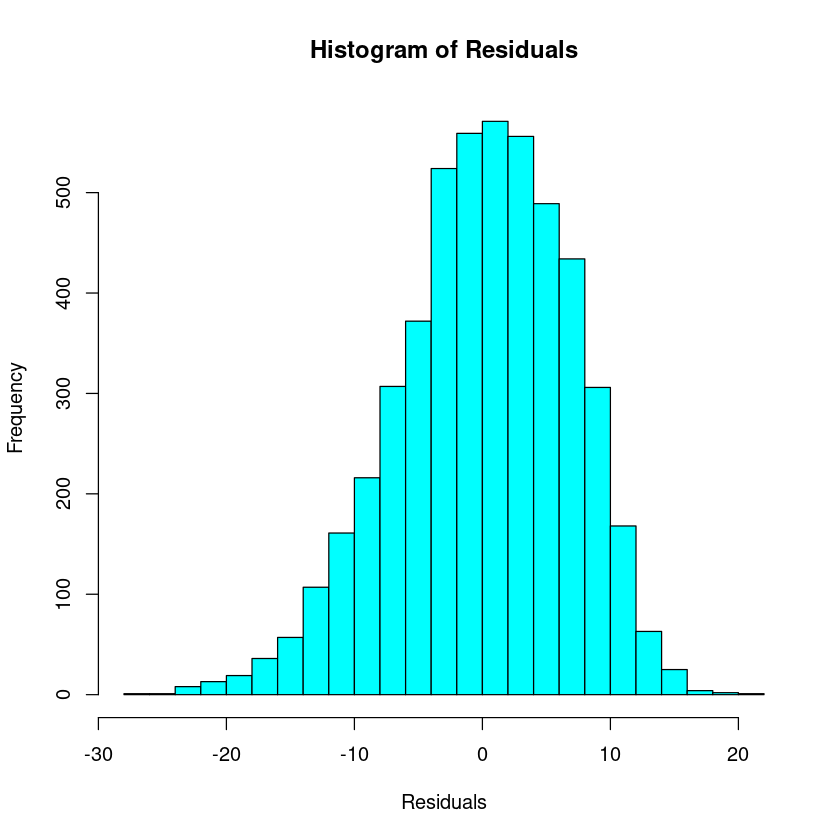

In [61]:
hist(sampled_residuals, breaks = 30, main = "Histogram of Residuals", xlab = "Residuals", col = "cyan")


In [62]:
dw_test <- dwtest(temp_model_4)

print(dw_test)


	Durbin-Watson test

data:  temp_model_4
DW = 2.0119, p-value = 0.7248
alternative hypothesis: true autocorrelation is greater than 0



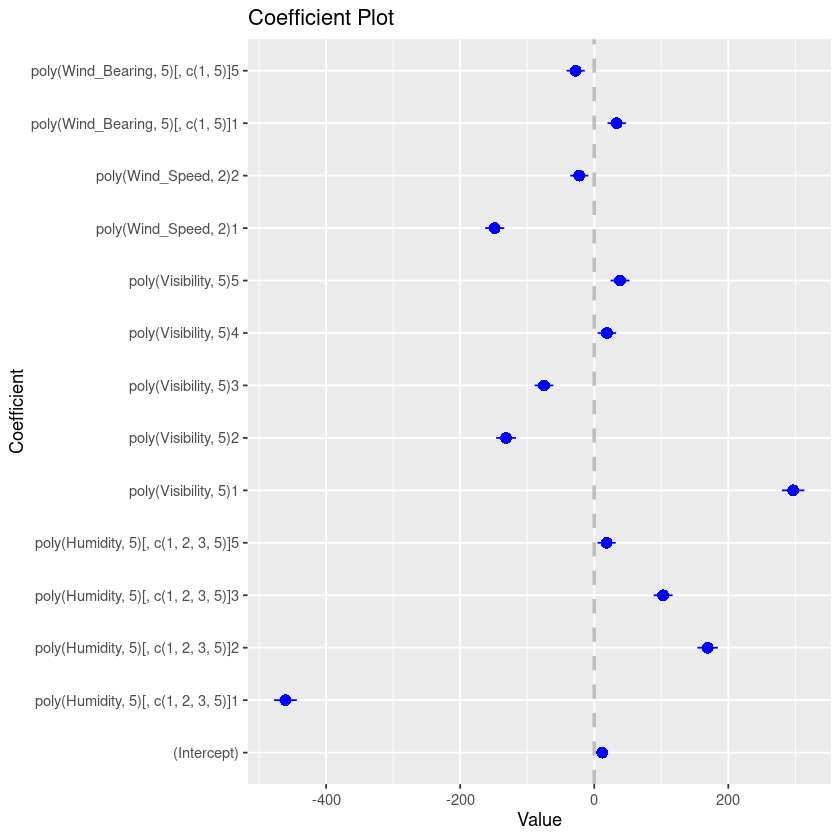

In [69]:

coefplot(temp_model_4)


In [71]:
gq_test <- gqtest(temp_model_4 , data = WeatherData)

print(gq_test)


	Goldfeld-Quandt test

data:  temp_model_4
GQ = 1.0163, df1 = 4986, df2 = 4986, p-value = 0.2841
alternative hypothesis: variance increases from segment 1 to 2



In [74]:
gq_test_humidity <- gqtest(temp_model_4 , order.by = ~ Humidity ,data = WeatherData)

print(gq_test_humidity)


	Goldfeld-Quandt test

data:  temp_model_4
GQ = 0.82645, df1 = 4986, df2 = 4986, p-value = 1
alternative hypothesis: variance increases from segment 1 to 2



In [75]:
gq_test_visibility <- gqtest(temp_model_4 , order.by = ~ Visibility ,data = WeatherData)

print(gq_test_visibility)


	Goldfeld-Quandt test

data:  temp_model_4
GQ = 0.9952, df1 = 4986, df2 = 4986, p-value = 0.5675
alternative hypothesis: variance increases from segment 1 to 2



In [76]:
gq_test_wind_speed <- gqtest(temp_model_4 , order.by = ~ Wind_Speed ,data = WeatherData)

print(gq_test_wind_speed)


	Goldfeld-Quandt test

data:  temp_model_4
GQ = 0.93312, df1 = 4986, df2 = 4986, p-value = 0.9927
alternative hypothesis: variance increases from segment 1 to 2



In [86]:
gq_test_wind_bearing <- gqtest(temp_model_4 , order.by = ~ Wind_Bearing ,data = WeatherData)

print(gq_test_wind_bearing)


	Goldfeld-Quandt test

data:  temp_model_4
GQ = 0.98548, df1 = 4986, df2 = 4986, p-value = 0.6972
alternative hypothesis: variance increases from segment 1 to 2



In [87]:
gq_test_pressure <- gqtest(temp_model_4 , order.by = ~ Pressure ,data = WeatherData)

print(gq_test_pressure)



	Goldfeld-Quandt test

data:  temp_model_4
GQ = 1.2127, df1 = 4986, df2 = 4986, p-value = 5.158e-12
alternative hypothesis: variance increases from segment 1 to 2



In [85]:
vif_values <- vif(temp_model_4)

print(vif_values)

                                       GVIF Df GVIF^(1/(2*Df))
poly(Humidity, 5)[, c(1, 2, 3, 5)] 2.070139  4        1.095216
poly(Visibility, 5)                2.034219  5        1.073593
poly(Wind_Speed, 2)                1.137750  2        1.032789
poly(Wind_Bearing, 5)[, c(1, 5)]   1.039362  2        1.009699


poly(Humidity, 5)[, c(1, 2, 3, 5)]

GVIF: 2.070139

Df: 4

Adjusted GVIF: 1.095216

Interpretation: This term, representing a polynomial transformation of humidity excluding the 4th degree, shows a moderate increase in multicollinearity. An adjusted GVIF above 1 but close to 1 indicates some multicollinearity, but it is not severe.

poly(Visibility, 5)

GVIF: 2.034219

Df: 5

Adjusted GVIF: 1.073593

Interpretation: This full polynomial transformation of visibility up to the 5th degree also shows a moderate level of multicollinearity. The adjusted GVIF is slightly above 1, suggesting a mild impact.

poly(Wind_Speed, 2)

GVIF: 1.137750

Df: 2

Adjusted GVIF: 1.032789

Interpretation: A quadratic transformation of wind speed shows relatively low multicollinearity, with an adjusted GVIF just above 1, which is generally not a cause for concern.

poly(Wind_Bearing, 5)[, c(1, 5)]

GVIF: 1.039362

Df: 2

Adjusted GVIF: 1.009699

Interpretation: This term, focusing on the 1st and 5th degree polynomial of wind bearing, shows minimal multicollinearity. The adjusted GVIF is very close to 1, indicating that these transformations do not contribute significantly to multicollinearity in your model.
